In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from open_ephys.analysis import Session
import os
import re
from scipy.signal import butter, filtfilt, lfilter
from collections import defaultdict
import scipy.stats as stats


# ==== Select Session ====
w = 1  # recordnode index 1 = Record Node 111 RAW is Offline Filtered
u = 0       # recordnode index 0 = Record Node 106 is Online Filtered


#IF INFLECTION POINT AT 5 ms
m_wave_start, m_wave_end = 1.5, 4.5
h_wave_start, h_wave_end = 5.5, 10

def scan_experiment_structure(session_dir, record_node_name="Record Node 106"):
    node_path = os.path.join(session_dir, record_node_name)
    
    if not os.path.exists(node_path):
        print(f"Record Node directory not found: {node_path}")
        return {}
    
    experiment_info = defaultdict(list)
    for item in sorted(os.listdir(node_path)):
        exp_path = os.path.join(node_path, item)
        if os.path.isdir(exp_path) and item.startswith("experiment"):
            recordings = [r for r in sorted(os.listdir(exp_path)) 
                          if os.path.isdir(os.path.join(exp_path, r)) and r.startswith("recording")]
            experiment_info[item] = recordings
    return experiment_info

# ==== Load Session ====
#directory = 'SAP-55_2025-06-09_11-12-19_001'
#directory = 'SEQ-05_TEST12025-08-06_15-38-15_001'

#directory = 'SNARE-38_TEST2025-07-24_13-46-09_003'
#directory = 'SNARE-38-TEST3_2025-07-24_16-05-17_002'


#directory = 'SEQ-06/SEQ-6_TEST2025-08-13_13-12-10_001'
#directory = 'SEQ-06/SEQ-6_TRAIN2025-08-13_15-57-16_002'

#directory = 'SEQ-06/SEQ-6_TRAIN2_2025-08-13_16-52-15_003'

#directory = 'REG-03/REG-03-RAMP2_2025-08-19_17-53-12_002'

#directory = 'HRPilot-05_FirstChronicTest1_2025-08-27_17-17-00_001'

directory = 'HRPilot-06_FirstChronic_ForReal_2025-09-03_10-50-26_002'

session = Session(directory)
print('Pass Initial Test, Moving on to Loading Session...\n')

# === Scan structure ===
record_node_name = "Record Node 106" if w == 0 else "Record Node 111"
structure = scan_experiment_structure(directory, record_node_name)

OSError: No available data format detected.

In [2]:
# === Flatten experiment-recording pairs to loop ===
flat_recordings = []
for exp_name, rec_list in structure.items():
    for rec in rec_list:
        flat_recordings.append((exp_name, rec))

Processing: x=1, y=recording2, exp=experiment1, yy=recording2

EXPERIMENT1, Recording 2
Open Ephys GUI Recording
ID: 0x141b2659a70
Format: Binary
Directory: HRPilot-06_FirstChronic_ForReal_2025-09-03_10-50-26_002\Record Node 111\experiment1\recording2
Experiment Index: 0
Recording Index: 1
Processor ID: 100, Stream Name: Rhythm Data, Line: 1 (main sync line))
  First event sample number: 27289054
  Last event sample number: 50739820
  Total sync events: 697
  Sample rate: 5000.0
Channels: ['CH1', 'CH5', 'CH7', 'CH11', 'ADC1'] 

Loaded 783 MessageCenter entries
[Time: 5455.988200 s] Message: Starting at 0.015 mA
[Time: 5457.785400 s] Message: RHDCONTROL TRIGGER 1 500.0
[Time: 5463.253800 s] Message: RHDCONTROL TRIGGER 1 500.0
[Time: 5465.777600 s] Message: RHDCONTROL TRIGGER 1 500.0
[Time: 5468.225000 s] Message: RHDCONTROL TRIGGER 1 500.0
[Time: 5470.825200 s] Message: RHDCONTROL TRIGGER 1 500.0
[Time: 5473.502000 s] Message: RHDCONTROL TRIGGER 1 500.0
[Time: 5482.909000 s] Message: St

C:\Users\dal866445\AppData\Local\Temp\ipykernel_19268\1654406780.py:91: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
c:\Users\dal866445\Documents\Github\open-ephys-python-tools\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


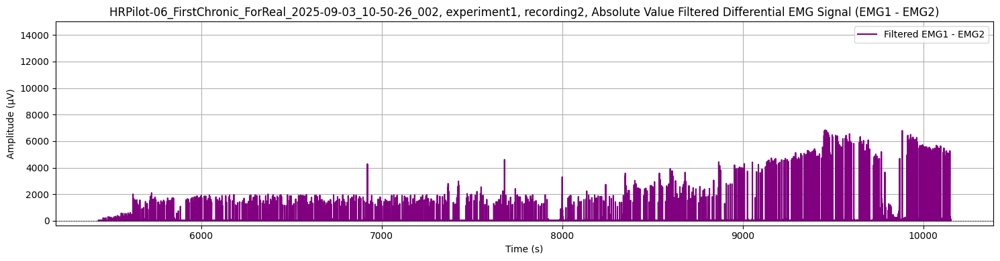

In [3]:
x = 1
exp = "experiment1"

y = f"recording{x + 1}"  # sequential label used in some parts of your code
yy = y
#y = f"recording{x}"  # sequential label used in some parts of your code
v = f"Record Node 106" if w == 0 else f"Record Node 111"
vv = f"Record Node 111" if u == 0 else f"Record Node 106"
i = 1

try:
    recording = session.recordnodes[w].recordings[x]
    #recording_offline = session.recordnodes[w].recordings[x]
except IndexError:
    print(f"No recording {x+1} found in {exp}/{yy}")
    

print(f"Processing: x={x}, y={y}, exp={exp}, yy={yy}")

# ==== Sync Setup ====
print(f"\n{exp.upper()}, Recording {x+1}")
print(recording)

# Only add sync line if a main one doesn't already exist
has_main_sync = any(sync.get("main", True) for sync in recording.sync_lines)
if not has_main_sync:
    recording.add_sync_line(1, 100, 'Rhythm Data', main=True)

recording.compute_global_timestamps()

metadata = recording.continuous[0].metadata
channel_names = metadata['channel_names']
print("Channels:", channel_names, '\n')

timestamps = recording.continuous[0].timestamps
#data_offline =  recording_offline.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(timestamps))
data = recording.continuous[0].get_samples(start_sample_index=0, end_sample_index=len(timestamps))
sample_rate = metadata['sample_rate']

# ==== EMG Processing ====
emg1_raw = data[:, 2]
emg2_raw = data[:, 3]
differential = (emg2_raw - emg1_raw)
lowcut = 100
highcut = 1000

b, a = butter(2, np.array([lowcut, highcut])/(sample_rate/2), btype='bandpass')


#y = lfilter(b, a, x) # only filters in the forward direction

differential_filt = lfilter(b, a, differential)
differential_abs = np.abs(differential_filt)
differential_emg = differential_abs

# ==== Load ADC1 (for stim detection) ====
adc1 = np.abs(data[:, 4])  # adjust if your ADC1 channel index differs

# ==== Sync Events ====
events = recording.events
sync_events = events[(events.line == 1) & (events.processor_id == 100) &
                        (events.stream_name == 'Rhythm Data') & (events.state == 1)]
sync_timestamps = sync_events['timestamp'].to_numpy()

# ==== Load MessageCenter ====
messagecenter_dir = os.path.join(directory, v, exp, yy, "events", "MessageCenter")
if not os.path.exists(messagecenter_dir):
    print(f"MessageCenter directory not found for {exp}/{yy}")
    

texts = np.load(os.path.join(messagecenter_dir, "text.npy"), allow_pickle=True)
timestamps_msg = np.load(os.path.join(messagecenter_dir, "timestamps.npy"))
decoded_texts = [t.decode('utf-8') if isinstance(t, bytes) else str(t) for t in texts]
message_entries = list(zip(timestamps_msg, decoded_texts))
print(f"Loaded {len(decoded_texts)} MessageCenter entries")

# ==== Debug Print ====
for text, time in zip(decoded_texts, timestamps_msg):
    print(f"[Time: {time:.6f} s] Message: {text}")

# ==== Full Trace Plot ====
plt.figure(figsize=(15, 4))
plt.plot(timestamps, differential_emg, label="Filtered EMG1 - EMG2", color='purple')
plt.axhline(0, color='black', linestyle='--', linewidth=0.5)
plt.title(f"{directory}, {exp}, {yy}, Absolute Value Filtered Differential EMG Signal (EMG1 - EMG2)")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude (μV)")
plt.grid(True)
plt.legend()
plt.ylim(top=15000)
plt.tight_layout()
plt.show()


In [4]:
# ==== Peri-Stimulus Analysis with Shaded Stimulus Duration ====
pre_event_time = 5   # ms before calculated stim start
post_event_time = 20 # ms after calculated stim start
stim_threshold = 0.1 # ADC1 threshold to detect pulse (adjust if needed)
offstim_threshold = 3

peri_stim_segments = []
peri_stim_segments_adc1 = []
segment_stim_end_times = []
segment_stim_start_times = []

In [5]:
for stamp in sync_timestamps:
        # First, find approximate sample index around the sync pulse
        #idx_start = np.searchsorted(timestamps, stamp)
        #idx_end   = np.searchsorted(timestamps, stamp + 0.010)
        #idx_center = (idx_start + idx_end)/2

        idx_search_start = np.searchsorted(timestamps, stamp - 0.00002)  # 10 ms before sync
        idx_search_end   = np.searchsorted(timestamps, stamp + 0.010)  # 10 ms after sync

        if idx_search_start < 0 or idx_search_end > len(timestamps):
            continue

        adc1_segment_for_detection = adc1[idx_search_start:idx_search_end]
        time_segment_for_detection = timestamps[idx_search_start:idx_search_end]

        # Detect true stim start: first crossing above threshold in that window
        above_idxs = np.where(adc1_segment_for_detection > stim_threshold)[0]
        
        if len(above_idxs) == 0:
            continue
        stim_start_idx = idx_search_start + above_idxs[0]
        stim_start_time = timestamps[stim_start_idx]

        # Now define peri-stimulus window around this stim_start_time
        idx_pre  = int(stim_start_idx - (pre_event_time / 1000) * sample_rate)
        idx_post = int(stim_start_idx + (post_event_time / 1000) * sample_rate)

        if idx_pre < 0 or idx_post > len(timestamps):
            continue

        # Extract windows
        time_window = timestamps[idx_pre:idx_post]
        time_zeroed = time_window - stim_start_time  # in seconds

        emg_window  = differential_emg[idx_pre:idx_post]
        adc1_window = adc1[idx_pre:idx_post]

        # Detect stim end: first time after stim_start where ADC1 falls back below threshold
        post_onset_mask = (time_zeroed >= 0)
        adc1_post_onset = adc1_window[post_onset_mask]
        time_post_onset = time_zeroed[post_onset_mask]

        below_idxs = np.where(adc1_post_onset < offstim_threshold)[0]
        if len(below_idxs) > 0:
            stim_end_time = time_post_onset[below_idxs[0]] * 1000  # convert to ms
        else:
            stim_end_time = post_event_time

        # Save for grouping
        peri_stim_segments.append((time_zeroed * 1000, emg_window, stim_end_time))
        peri_stim_segments_adc1.append(adc1_window)
        segment_stim_start_times.append(stim_start_time)
        segment_stim_end_times.append(stim_end_time)


In [6]:
print(time_window)
print(idx_search_start)
print(idx_search_end)
print(peri_stim_segments_adc1)
print(peri_stim_segments)
print(stim_end_time)
type(stim_end_time)

[10147.959  10147.9592 10147.9594 10147.9596 10147.9598 10147.96
 10147.9602 10147.9604 10147.9606 10147.9608 10147.961  10147.9612
 10147.9614 10147.9616 10147.9618 10147.962  10147.9622 10147.9624
 10147.9626 10147.9628 10147.963  10147.9632 10147.9634 10147.9636
 10147.9638 10147.964  10147.9642 10147.9644 10147.9646 10147.9648
 10147.965  10147.9652 10147.9654 10147.9656 10147.9658 10147.966
 10147.9662 10147.9664 10147.9666 10147.9668 10147.967  10147.9672
 10147.9674 10147.9676 10147.9678 10147.968  10147.9682 10147.9684
 10147.9686 10147.9688 10147.969  10147.9692 10147.9694 10147.9696
 10147.9698 10147.97   10147.9702 10147.9704 10147.9706 10147.9708
 10147.971  10147.9712 10147.9714 10147.9716 10147.9718 10147.972
 10147.9722 10147.9724 10147.9726 10147.9728 10147.973  10147.9732
 10147.9734 10147.9736 10147.9738 10147.974  10147.9742 10147.9744
 10147.9746 10147.9748 10147.975  10147.9752 10147.9754 10147.9756
 10147.9758 10147.976  10147.9762 10147.9764 10147.9766 10147.9768

numpy.float64

In [7]:
# ==== Dynamically determine stimulation groups based on event messages ====

# First, extract only trigger messages and stim setting messages
trigger_pattern = re.compile(r"RHDCONTROL TRIGGER")
stim_pattern = re.compile(r"starting(?: at)? (\d+\.?\d*)\s*mA", re.IGNORECASE)

stim_groups = []
current_group = []
current_amp = None
trigger_times = []

for t, msg in message_entries:
    if stim_pattern.search(msg):
        # Save the previous group if any
        if current_amp is not None and current_group:
            stim_groups.append((current_amp, current_group))
        # Start new group
        current_amp = float(stim_pattern.search(msg).group(1))
        current_group = []
    elif trigger_pattern.search(msg):
        if current_amp is not None:
            current_group.append(t)

# Don't forget to save the last group
if current_amp is not None and current_group:
    stim_groups.append((current_amp, current_group))


In [8]:
# ==== Match trigger times to peri_stim_segments ====
# Create dictionary to associate each stim amplitude to its segments
stim_intensities = []
m_wave_peaks = []
h_wave_peaks = []

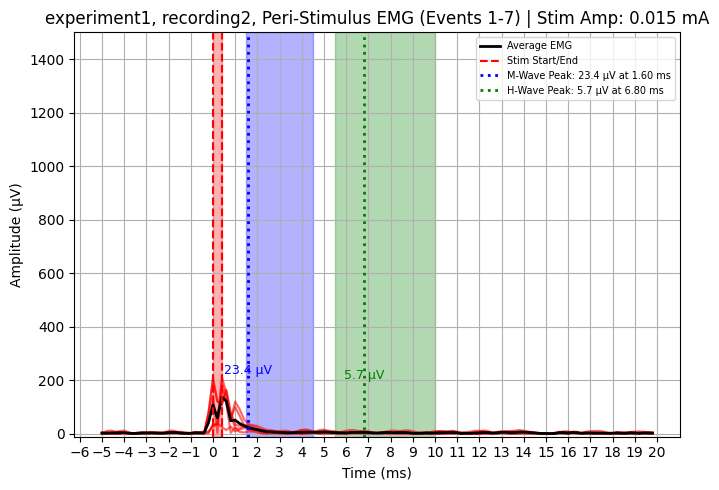

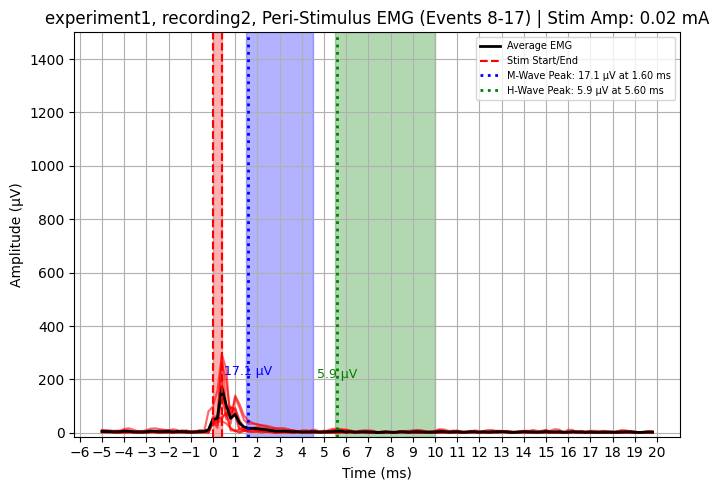

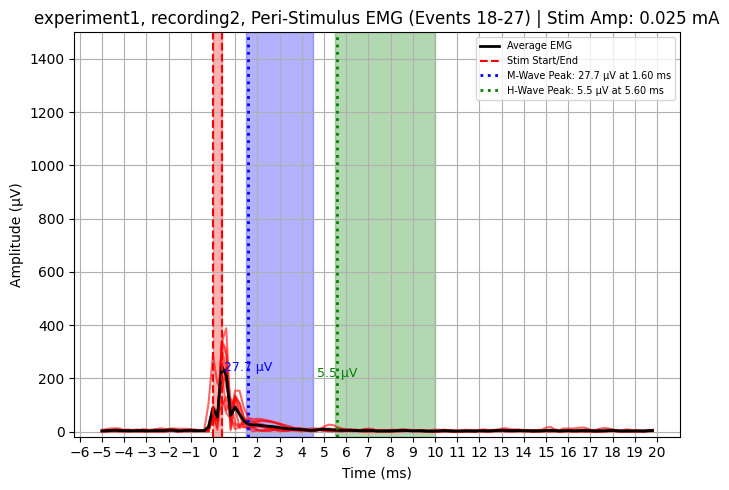

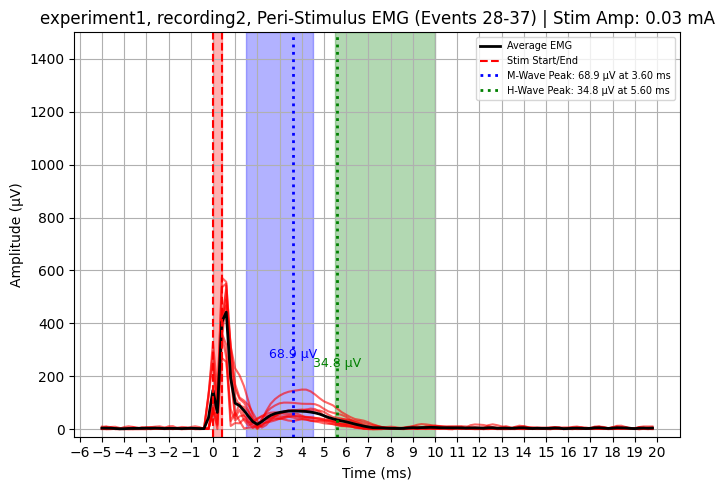

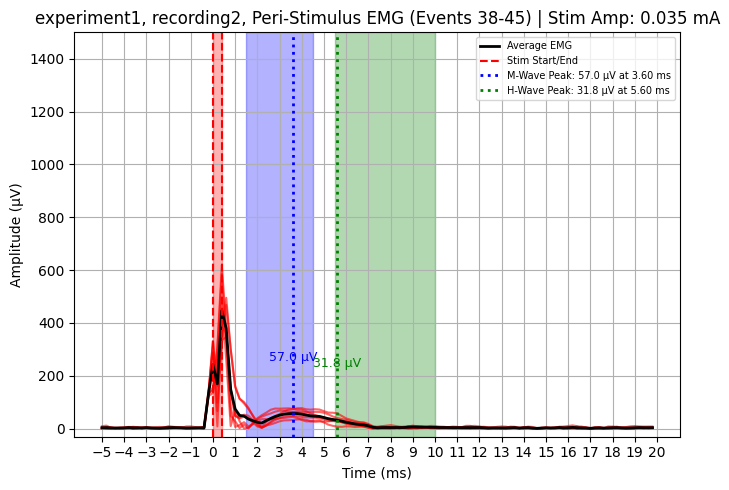

...

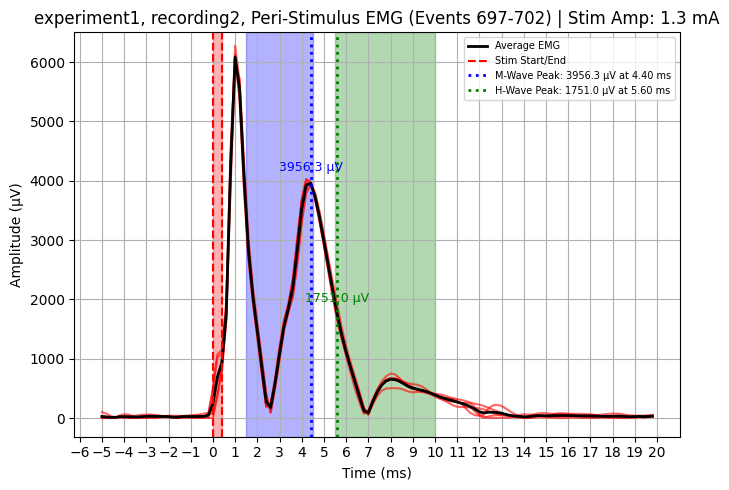

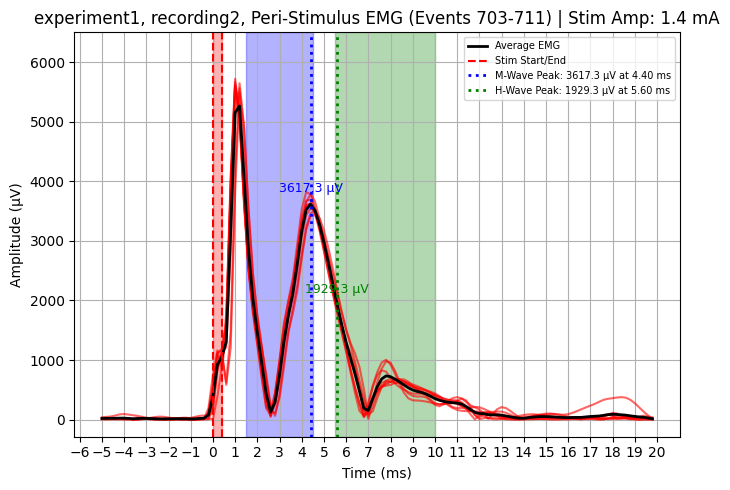

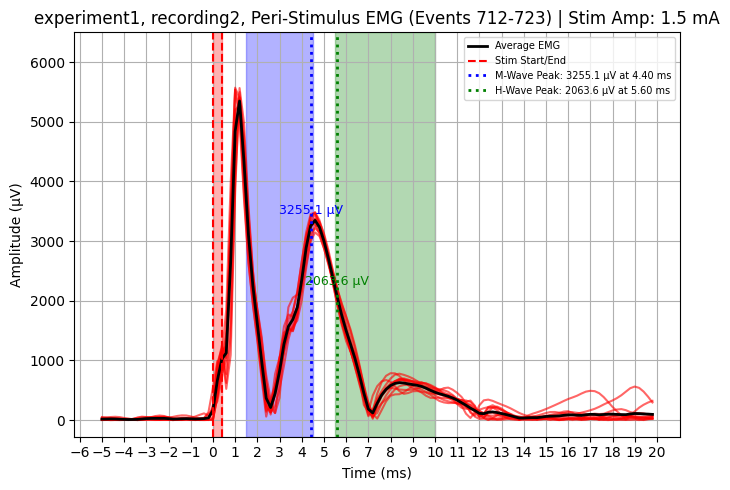

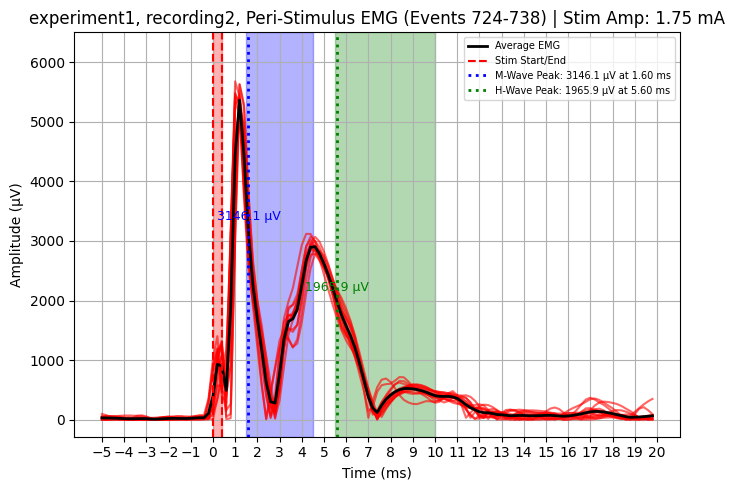

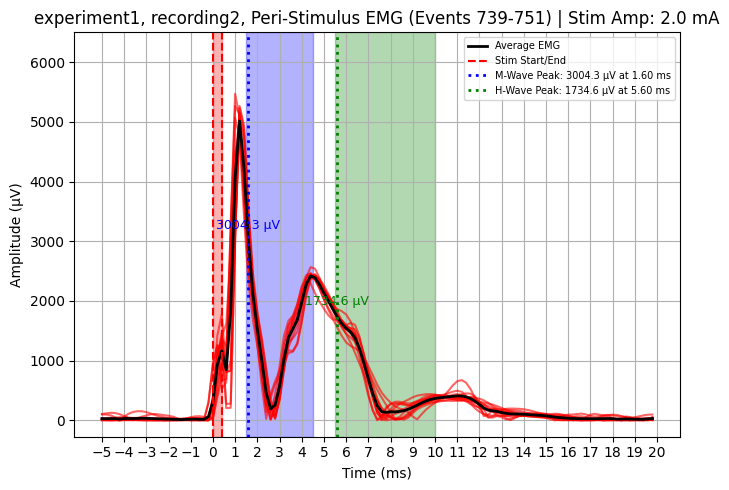

'\nfor stim_amp, trigger_times_group in stim_groups:\n    # For each trigger time, find matching peri_stim segment (by start time)\n    group_data = []\n    group_start_times = []\n    group_end_times = []\n    group_adc1 = []\n\n    for trig_time in trigger_times_group:\n        # Find closest stim_start_time to this trigger time\n        idx_match = np.argmin(np.abs(np.array(segment_stim_start_times) - trig_time))\n        # Extra check: ensure it\'s reasonably close (e.g., within 100 ms)\n        if abs(segment_stim_start_times[idx_match] - trig_time) < 0.1:\n            group_data.append(peri_stim_segments[idx_match])\n            group_adc1.append(peri_stim_segments_adc1[idx_match])\n            group_start_times.append(segment_stim_start_times[idx_match])\n            group_end_times.append(segment_stim_end_times[idx_match])\n\n    if not group_data:\n        continue  # skip if no valid matching data\n\n    # Proceed with same logic as original\n    time_ms_matrix = np.stack([gd

In [9]:
for stim_amp, trigger_times_group in stim_groups:
    # For each trigger time, find matching peri_stim segment (by start time)
    group_data = []
    group_start_times = []
    group_end_times = []
    group_adc1 = []

    for trig_time in trigger_times_group:
        # Find closest stim_start_time to this trigger time
        idx_match = np.argmin(np.abs(np.array(segment_stim_start_times) - trig_time))
        # Extra check: ensure it's reasonably close (e.g., within 100 ms)
        if abs(segment_stim_start_times[idx_match] - trig_time) < 0.1:
            group_data.append(peri_stim_segments[idx_match])
            group_adc1.append(peri_stim_segments_adc1[idx_match])
            group_start_times.append(segment_stim_start_times[idx_match])
            group_end_times.append(segment_stim_end_times[idx_match])

    if not group_data:
        continue  # skip if no valid matching data

    # Proceed with same logic as original
    time_ms_matrix = np.stack([gd[0] for gd in group_data])
    emg_matrix     = np.stack([gd[1] for gd in group_data])

    avg_time_ms = time_ms_matrix[0]  # identical for all in group
    avg_adc1 = np.mean(group_adc1, axis=0)
    avg_emg     = np.mean(emg_matrix, axis=0)
    avg_end_ms  = np.mean(group_end_times)

    stim_intensities.append(stim_amp)

    plt.figure(figsize=(7, 5))

    for (_, trace, _) in group_data:
        plt.plot(avg_time_ms, trace, color='red', alpha=0.6)
    plt.plot(avg_time_ms, avg_emg, color='black', linewidth=2, label='Average EMG')

    plt.axvline(x=0, color='red', linestyle='--', label='_nolegend_')
    plt.axvline(x=stim_end_time, color='red', linestyle='--', label='Stim Start/End')
    plt.axvspan(0, stim_end_time, color='red', alpha=0.3)

    

    plt.axvspan(m_wave_start, m_wave_end, color='blue', alpha=0.3)
    plt.axvspan(h_wave_start, h_wave_end, color='green', alpha=0.3)

    m_wave_mask = (avg_time_ms >= m_wave_start) & (avg_time_ms <= m_wave_end)
    m_wave_time_window = avg_time_ms[m_wave_mask]
    m_wave_emg_window = avg_emg[m_wave_mask]
    m_wave_peak_idx = np.argmax(m_wave_emg_window)
    m_wave_peak_time = m_wave_time_window[m_wave_peak_idx]
    m_wave_peak_amp = m_wave_emg_window[m_wave_peak_idx]
    m_wave_peaks.append(m_wave_peak_amp)

    h_wave_mask = (avg_time_ms >= h_wave_start) & (avg_time_ms <= h_wave_end)
    h_wave_time_window = avg_time_ms[h_wave_mask]
    h_wave_emg_window = avg_emg[h_wave_mask]
    h_wave_peak_idx = np.argmax(h_wave_emg_window)
    h_wave_peak_time = h_wave_time_window[h_wave_peak_idx]
    h_wave_peak_amp = h_wave_emg_window[h_wave_peak_idx]
    h_wave_peaks.append(h_wave_peak_amp)

    plt.axvline(x=m_wave_peak_time, color='blue', linestyle=':', linewidth=2,
                label=f'M-Wave Peak: {m_wave_peak_amp:.1f} μV at {m_wave_peak_time:.2f} ms')
    plt.axvline(x=h_wave_peak_time, color='green', linestyle=':', linewidth=2,
                label=f'H-Wave Peak: {h_wave_peak_amp:.1f} μV at {h_wave_peak_time:.2f} ms')

    plt.text(m_wave_peak_time, m_wave_peak_amp + 200, f'{m_wave_peak_amp:.1f} μV',
            color='blue', fontsize=9, ha='center')
    plt.text(h_wave_peak_time, h_wave_peak_amp + 200, f'{h_wave_peak_amp:.1f} μV',
            color='green', fontsize=9, ha='center')


    # ==== Dynamic Y-axis scaling ====
    max_peak = max(abs(m_wave_peak_amp), abs(h_wave_peak_amp))
    if max_peak < 1000:
        plt.ylim(top = 1500)

    if max_peak > 1000:
        plt.ylim(top = 3500)

    if max_peak > 2000:
        plt.ylim(top = 6500)
        

    plt.title(f"{exp}, {yy}, Peri-Stimulus EMG "
            f"(Events {i}-{i + (1)*len(group_data)}) | Stim Amp: {stim_amp} mA")
    plt.xlabel("Time (ms)")
    plt.ylabel("Amplitude (μV)")
    plt.grid(True)
    plt.legend(
        fontsize=7,
        loc="upper right",
        frameon=True,
        framealpha=0.8
    )
    #plt.ylim(top=1500)

    min_ms = int(np.floor(avg_time_ms[0]))
    max_ms = int(np.ceil(avg_time_ms[-1]))
    plt.xticks(np.arange(min_ms, max_ms + 1, 1))

    plt.tight_layout()
    plt.show()
    i = i + (1)*len(group_data) + 1



############################ THE CODE BELOW IS WITH THE ADC LINE PLOT ADDED ##################

'''
for stim_amp, trigger_times_group in stim_groups:
    # For each trigger time, find matching peri_stim segment (by start time)
    group_data = []
    group_start_times = []
    group_end_times = []
    group_adc1 = []

    for trig_time in trigger_times_group:
        # Find closest stim_start_time to this trigger time
        idx_match = np.argmin(np.abs(np.array(segment_stim_start_times) - trig_time))
        # Extra check: ensure it's reasonably close (e.g., within 100 ms)
        if abs(segment_stim_start_times[idx_match] - trig_time) < 0.1:
            group_data.append(peri_stim_segments[idx_match])
            group_adc1.append(peri_stim_segments_adc1[idx_match])
            group_start_times.append(segment_stim_start_times[idx_match])
            group_end_times.append(segment_stim_end_times[idx_match])

    if not group_data:
        continue  # skip if no valid matching data

    # Proceed with same logic as original
    time_ms_matrix = np.stack([gd[0] for gd in group_data])
    emg_matrix     = np.stack([gd[1] for gd in group_data])

    avg_time_ms = time_ms_matrix[0]  # identical for all in group
    avg_adc1 = np.mean(group_adc1, axis=0)
    avg_emg     = np.mean(emg_matrix, axis=0)
    avg_end_ms  = np.mean(group_end_times)

    stim_intensities.append(stim_amp)

    #plt.figure(figsize=(7, 4))
    fig, axs = plt.subplots(2, 1, figsize=(7, 5), sharex=True, gridspec_kw={'height_ratios':[3,1]})

    for (_, trace, _) in group_data:
        axs[0].plot(avg_time_ms, trace, color='red', alpha=0.6)
    axs[0].plot(avg_time_ms, avg_emg, color='black', linewidth=2, label='Average EMG')

    axs[0].axvline(x=0, color='red', linestyle='--', label='Stim Start')

    #plt.axvline(x=1.0, color='red', linestyle='--', label='_nolegend_')
    #plt.axvspan(0, 1.0, color='red', alpha=0.3)

    #---------------Here we can manually set the red box width for the stimm ----------------#
    axs[0].axvline(x=stim_end_time, color='red', linestyle='--', label='Stim End')
    axs[0].axvspan(0, stim_end_time, color='red', alpha=0.3)


    axs[0].axvspan(m_wave_start, m_wave_end, color='blue', alpha=0.3)
    axs[0].axvspan(h_wave_start, h_wave_end, color='green', alpha=0.3)

    m_wave_mask = (avg_time_ms >= m_wave_start) & (avg_time_ms <= m_wave_end)
    m_wave_time_window = avg_time_ms[m_wave_mask]
    m_wave_emg_window = avg_emg[m_wave_mask]
    m_wave_peak_idx = np.argmax(m_wave_emg_window)
    m_wave_peak_time = m_wave_time_window[m_wave_peak_idx]
    m_wave_peak_amp = m_wave_emg_window[m_wave_peak_idx]
    m_wave_peaks.append(m_wave_peak_amp)

    h_wave_mask = (avg_time_ms >= h_wave_start) & (avg_time_ms <= h_wave_end)
    h_wave_time_window = avg_time_ms[h_wave_mask]
    h_wave_emg_window = avg_emg[h_wave_mask]
    h_wave_peak_idx = np.argmax(h_wave_emg_window)
    h_wave_peak_time = h_wave_time_window[h_wave_peak_idx]
    h_wave_peak_amp = h_wave_emg_window[h_wave_peak_idx]
    h_wave_peaks.append(h_wave_peak_amp)

    axs[0].axvline(x=m_wave_peak_time, color='blue', linestyle=':', linewidth=2,
                label=f'M-Wave Peak: {m_wave_peak_amp:.1f} μV at {m_wave_peak_time:.2f} ms')
    axs[0].axvline(x=h_wave_peak_time, color='green', linestyle=':', linewidth=2,
                label=f'H-Wave Peak: {h_wave_peak_amp:.1f} μV at {h_wave_peak_time:.2f} ms')

    axs[0].text(m_wave_peak_time, m_wave_peak_amp + 200, f'{m_wave_peak_amp:.1f} μV',
                color='blue', fontsize=9, ha='center')
    axs[0].text(h_wave_peak_time, h_wave_peak_amp + 200, f'{h_wave_peak_amp:.1f} μV',
                color='green', fontsize=9, ha='center')
    
    #plt.title(
    #    f"{exp}, {yy}, Peri-Stimulus EMG "
    #    f"(Triggers: {len(group_data)}) | Stim Amp: {stim_amp} mA"
    #)
    axs[0].set_title(
        f"{exp}, {yy}, Peri-Stimulus EMG "
        f"(Events {i}-{i + (1)*len(group_data)}) | Stim Amp: {stim_amp} mA"
    )
    axs[0].set_xlabel("Time (ms)")
    axs[0].set_ylabel("Amplitude (μV)")
    axs[0].grid(True)
    axs[0].legend()
    axs[0].set_ylim(top=1500)

    min_ms = int(np.floor(avg_time_ms[0]))
    max_ms = int(np.ceil(avg_time_ms[-1]))
    axs[0].set_xticks(np.arange(min_ms, max_ms + 1, 1))
    #axs[0].tick_params(labelbottom=True)
    #axs[0].set_xlim(min_ms, max_ms)  # ensures full range is visible
    #axs[0].set_xticks(np.arange(int(avg_time_ms[0])-1, int(avg_time_ms[-1])+2, 1))
    #axs[0].set_xticks(np.arange(np.floor(avg_time_ms[0]), np.ceil(avg_time_ms[-1]) + 1, 1))
    
    


    for (trace) in group_adc1:
        axs[1].plot(avg_time_ms, trace, color='green', alpha=0.5)
    axs[1].plot(avg_time_ms, avg_adc1, color='black', linewidth=2, label='Avg ADC1')
    axs[1].axvline(0, color='red', linestyle='--', label='Stim Start')
    axs[1].axvline(stim_end_time, color='red', linestyle='--', label='Stim End')
    axs[1].set_title("Peri-Stimulus ADC1")
    axs[1].set_xlabel("Time (ms)")
    axs[1].set_ylabel("ADC1 Signal")
    axs[1].legend()
    axs[1].grid(True)
    axs[1].set_xticks(np.arange(min_ms, max_ms + 1, 1))
    #axs[1].set_xlim(min_ms, max_ms)
    #axs[1].set_xticks(np.arange(int(avg_time_ms[0])-1, int(avg_time_ms[-1])+2, 1))
    #axs[1].set_xticks(np.arange(np.floor(avg_time_ms[0]), np.ceil(avg_time_ms[-1]) + 1, 1))

    plt.tight_layout()
    plt.show()
    i = i + (1)*len(group_data) + 1

'''



In [10]:
#avg_emg  = np.mean(group_emg, axis=0)
#avg_adc1 = np.mean(group_adc1, axis=0)
#avg_end_time = np.mean(segment_stim_end_times)
#print(trace)
#print(time_ms)
#print(avg_adc1)
#print(avg_emg)
#print(avg_end_time)
#print(segment_stim_start_times)
#print(group_emg)

C:\Users\dal866445\AppData\Local\Temp\ipykernel_19268\1099511689.py:18: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  m_sems  = np.array([stats.sem(peaks) for peaks in m_wave_data])
C:\Users\dal866445\AppData\Local\Temp\ipykernel_19268\1099511689.py:19: SmallSampleWarning: One or more sample arguments is too small; all returned values will be NaN. See documentation for sample size requirements.
  h_sems  = np.array([stats.sem(peaks) for peaks in h_wave_data])


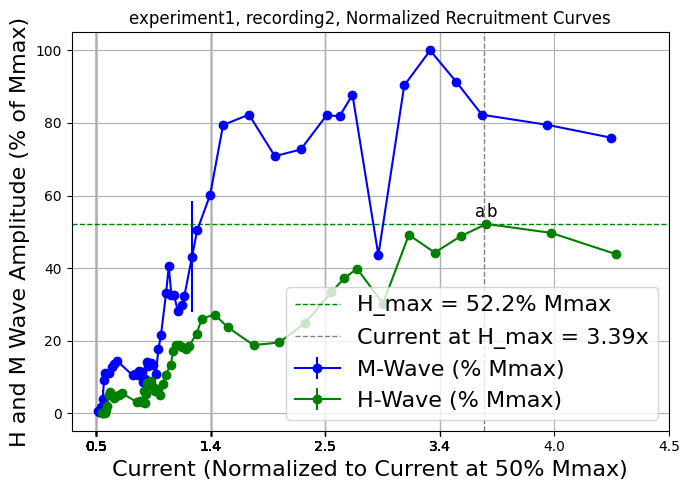

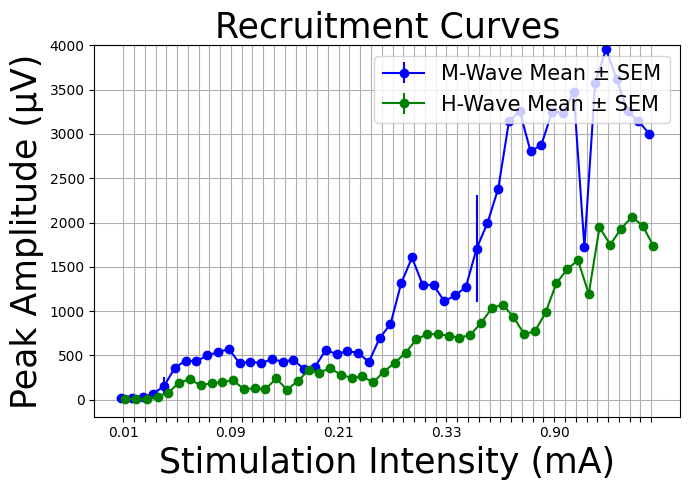

In [11]:
# ==== Group and Normalize Peak Amplitudes ====
m_wave_dict = defaultdict(list)
h_wave_dict = defaultdict(list)

# Ensure all amplitudes are absolute values
for amp, m_peak, h_peak in zip(stim_intensities, m_wave_peaks, h_wave_peaks):
    m_wave_dict[amp].append(abs(m_peak))
    h_wave_dict[amp].append(abs(h_peak))

# Sort stimulation intensities
sorted_amps = sorted(set(stim_intensities))
m_wave_data = [m_wave_dict[amp] for amp in sorted_amps]
h_wave_data = [h_wave_dict[amp] for amp in sorted_amps]

# Compute means
m_means = np.array([np.mean(peaks) for peaks in m_wave_data])
h_means = np.array([np.mean(peaks) for peaks in h_wave_data])
m_sems  = np.array([stats.sem(peaks) for peaks in m_wave_data])
h_sems  = np.array([stats.sem(peaks) for peaks in h_wave_data])

# Find M_max and normalize amplitudes
M_max = np.max(m_means)
m_means_norm = (m_means / M_max) * 100
h_means_norm = (h_means / M_max) * 100
m_sems_norm  = (m_sems  / M_max) * 100
h_sems_norm  = (h_sems  / M_max) * 100

# Interpolate M-curve to find current at 50% M_max
from scipy.interpolate import interp1d

interp_func = interp1d(m_means_norm, sorted_amps, kind='linear', bounds_error=False, fill_value='extrapolate')
try:
    current_at_50_percent = float(interp_func(50))
except:
    current_at_50_percent = sorted_amps[np.argmax(m_means_norm >= 50)]

# Normalize current axis
normalized_currents = np.array(sorted_amps) / current_at_50_percent

# Mark H_max (point "a") and Current at H_max (point "b")
H_max = np.max(h_means_norm)
idx_Hmax = np.argmax(h_means_norm)
current_at_Hmax_norm = normalized_currents[idx_Hmax]

# ==== Plot Normalized Recruitment Curves ====
fig, ax = plt.subplots(figsize=(7, 5))

# Overlay normalized mean ± SEM
ax.errorbar(normalized_currents - 0.02, m_means_norm, yerr=m_sems_norm, fmt='o-', color='blue', label='M-Wave (% Mmax)')
ax.errorbar(normalized_currents + 0.02, h_means_norm, yerr=h_sems_norm, fmt='o-', color='green', label='H-Wave (% Mmax)')

# Add point "a" (H_max) and "b" (Current at H_max)
ax.axhline(H_max, color='green', linestyle='--', linewidth=1, label=f'H_max = {H_max:.1f}% Mmax')
ax.axvline(current_at_Hmax_norm, color='gray', linestyle='--', linewidth=1, label=f'Current at H_max = {current_at_Hmax_norm:.2f}x')

# Add labels
ax.text(current_at_Hmax_norm + 0.02, H_max + 2, 'b', fontsize=12, color='black')
ax.text(normalized_currents[idx_Hmax] - 0.08, H_max + 2, 'a', fontsize=12, color='black')

# Aesthetics
ax.set_xticks(np.round(normalized_currents, ))
ax.set_xticklabels([f"{x:.1f}" for x in normalized_currents])
ax.set_xlabel("Current (Normalized to Current at 50% Mmax)", fontsize=16)
ax.set_ylabel("H and M Wave Amplitude (% of Mmax)", fontsize=16)
ax.set_title(f"{exp}, {yy}, Normalized Recruitment Curves")
ax.grid(True)
ax.legend(fontsize=16)
#ax.set_xlim(right=1.4)
#ax.set_xlim(left=0)
plt.tight_layout()
plt.show()



regular_currents = np.array(sorted_amps)
H_max = np.max(h_means)
idx_Hmax_reg = np.argmax(h_means)
current_at_Hmax = regular_currents[idx_Hmax_reg] + 20.0

M_max = np.max(m_means)
idx_Mmax_reg = np.argmax(m_means)
current_at_Mmax = regular_currents[idx_Mmax_reg] + 31.5
# Normalize current axis


# ==== Plot Recruitment Curves as Box-and-Whisker ====
fig, ax = plt.subplots(figsize=(7, 5))



# Boxplots
positions = np.arange(len(sorted_amps))  # for spacing

#Overlay mean ± SEM
ax.errorbar(positions - 0.2, m_means, yerr=m_sems, fmt='o-', color='blue', label='M-Wave Mean ± SEM')
ax.errorbar(positions + 0.2, h_means, yerr=h_sems, fmt='o-', color='green', label='H-Wave Mean ± SEM')

# Overlay normalized mean ± SEM
#ax.errorbar(normalized_currents - 0.02, m_means_norm, yerr=m_sems_norm, fmt='o-', color='blue', label='M-Wave (% Mmax)')
#ax.errorbar(normalized_currents + 0.02, h_means_norm, yerr=h_sems_norm, fmt='o-', color='green', label='H-Wave (% Mmax)')


# Add point "a" (H_max) and "b" (Current at H_max)
#ax.axhline(M_max, color='black', linestyle='--', linewidth=1 )
#ax.axvline(current_at_Mmax, color='black', linestyle='--', linewidth=1)

#ax.axhline(M_max, color='black', linestyle='--', linewidth=1 )
#ax.axvline(current_at_Mmax, color='black', linestyle='--', linewidth=1)


## Add labels
#ax.text(current_at_Hmax - 3, H_max + 2, 'b', fontsize=30, color='black')
#ax.text(regular_currents[idx_Hmax] - 0.08, H_max + 2, 'a', fontsize=12, color='black')


# Aesthetics
ax.set_xticks(positions)
tick_labels = []
for i, amp in enumerate(sorted_amps):
    if i % 10 == 0:  # show every 10th label
        tick_labels.append(f"{amp:.2f}")
    else:
        tick_labels.append("")  # leave blank

ax.set_xticklabels(tick_labels)

#ax.set_xticklabels([f"{amp:.1f}" for amp in sorted_amps])
ax.set_xlabel("Stimulation Intensity (mA)", fontsize = 25)
ax.set_ylabel("Peak Amplitude (μV)", fontsize = 25)
#ax.set_title(f"{exp}, {yy}, Recruitment Curves")
ax.set_title("Recruitment Curves", fontsize=25)
ax.grid(True)
ax.legend(fontsize = 15, loc = "upper right")
ax.set_ylim(top=4000)
#ax.set_xlim(right=200)
#ax.set_xlim(left=0)
plt.tight_layout()
plt.show()